# Import

In [1]:
import pandas as pd
import numpy as np
from IPython.display import display
from itertools import combinations
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans

# Read

In [2]:
df10=pd.read_csv('pure_Labels_NLP.csv',\
                          parse_dates=['InvoiceDate'],\
                          dtype={'CustomerID':str,'InvoiceNo':str})

In [3]:
df11=pd.read_csv('pure_Labels_UnitPrice.csv',\
                          parse_dates=['InvoiceDate'],\
                          dtype={'CustomerID':str,'InvoiceNo':str})

In [4]:
df10.head(3)

,InvoiceNo,StockCode,Description,InvoiceDate,UnitPrice,CustomerID,Country,FinalQuantity,NLP_Kmeans_p6c7,NLP_Kmeans_p6c3,NLP_Kmeans_p955c3
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2010-12-01 08:26:00,2.55,17850,United Kingdom,6,4,1,1
1,536365,71053,WHITE METAL LANTERN,2010-12-01 08:26:00,3.39,17850,United Kingdom,6,0,2,0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,2010-12-01 08:26:00,2.75,17850,United Kingdom,8,1,1,1


In [5]:
df10.describe()

,UnitPrice,FinalQuantity,NLP_Kmeans_p6c7,NLP_Kmeans_p6c3,NLP_Kmeans_p955c3
count,383873.000000,383873.000000,383873.000000,383873.000000,383873.000000
mean,2.867834,12.764367,1.012840,1.854830,0.144352
std,4.135378,42.227435,1.773775,0.422351,0.420691
min,0.040000,1.000000,0.000000,0.000000,0.000000
25%,1.250000,2.000000,0.000000,2.000000,0.000000
50%,1.950000,6.000000,0.000000,2.000000,0.000000
75%,3.750000,12.000000,1.000000,2.000000,0.000000
max,649.500000,4800.000000,6.000000,2.000000,2.000000


# Automation class

In [6]:
class automation(): 
    def __init__(self,df,prod_labelCol,message):
        '''
        ip: a dataframe and the name of column which tells about the lebels of product description
        '''
        self.df=df.filter(['InvoiceNo','StockCode','Description',\
                           'InvoiceDate','UnitPrice','CustomerID',\
                           'Country','FinalQuantity',prod_labelCol])
        self.prod_labelCol=prod_labelCol
        self.message=message
        self.df_grpby_CustInvn=""
        self.df_grpby_baskets_Cust=""
        self.df_baskets=""
        self.df_customers=""
        self.list_colNames=[]
        
        self.df_clusterData=""
        self.cluster_labels=[]
        
        self.model_pca=""
        self.model_Kmeans=""
    
    def show(self):
        '''
        shows:
        a message given by user at the time of init
        head(3)
        shape of dataframe
        product column name
        '''
        
        print("\nIn show")
        
        print("####",self.message,"####\n")
        print("DataFrame:")
        display(self.df.head(3))
        print("shape: ",self.df.shape)
        print("")
        print("Product label column name: ",self.prod_labelCol)
        
    def show_baskets(self):
        '''
        shows:
        a message given by user at the time of init
        head(3)
        shape of baskets dataframe
        '''
        
        print("\nin show_baskets")
        
        print("####",self.message,"####\n")
        print("baskets DataFrame:")
        display(self.df_baskets.head(3))
        print("shape: ",self.df_baskets.shape)

    def show_customers(self):
        '''
        shows:
        a message given by user at the time of init
        head(3)
        shape of customers dataframe
        '''
        
        print("\nIn show_customers")
        
        print("####",self.message,"####\n")
        print("customers DataFrame:")
        display(self.df_customers.head(3))
        print("shape: ",self.df_customers.shape)
      
    def createCatColumns(self):
        '''
        based on unique categories given by the prod_labelCol,
        it creates those many columns and fills them with the purchase amount
        fills the NA values in those columns with 0
        '''
        
        print("\nin createCatColumns")
        print("Creating columns based on product labels")
        # creation of columns
        for i in range(self.df[self.prod_labelCol].nunique()):
            print("adding column: ",'Cat_{}'.format(i))
            self.list_colNames.append("Cat_{}".format(i))
            group=self.df.loc[self.df[self.prod_labelCol]==i]
            self.df.loc[:,'Cat_{}'.format(i)]=group['UnitPrice']*group['FinalQuantity']
        
        # fill na values
        print("filling NA values")
        self.df.fillna(0,inplace=True)
        print("Done")
        
    def createBasketsDataFrame(self,BasketPrice=True,InvoiceDate=True,v=True):
        '''
        create a groupby object by grouping ['CustomerID','InvoiceNo']
        filters the columns for only the required columns i.e. category columns
        
        provided everything is set to True:
        creates a column for BasketPrice
        creates a column for InvoiceDate
        '''
        
        print("\nin createBasketsDataFrame")
        
        # create a groupby object
        print("creating groupby object") if v else None
        self.df_grpby_CustInvn=self.df.groupby(['CustomerID','InvoiceNo'],as_index=False)
        print("done") if v else None
        
        # filter columns
        print("filtering columns") if v else None
        self.df_baskets=self.df_grpby_CustInvn.sum().\
        drop(['UnitPrice','FinalQuantity',self.prod_labelCol],axis=1)
        print("done") if v else None
        
        # create basket price column
        print("creating BasketPrice column") if v else None
        if BasketPrice:
            self.df_baskets['BasketPrice']=self.df_grpby_CustInvn.sum().\
            filter(self.list_colNames).sum(axis=1).values
        print("done") if v else None
        
        # create basket price column
        print("creating InvoiceDate column") if v else None
        if InvoiceDate:
            self.df_baskets['InvoiceDate']=self.df_grpby_CustInvn.first()['InvoiceDate'].values
        print("done") if v else None
    
    def createCustomersDataFrame(self,catOnly=False,\
                                 Frequency=True,\
                                 MinPurchase=True,\
                                 MaxPurchase=True,\
                                 MeanPurchase=True,\
                                 Percentage=True,\
                                 v=True):
        '''
        creates a dataframe where each row represents a customer
        percentage=True means it will calculate and set the percentage contribution of each category as value
        '''
        
        print("\nin createCustomersDataFrame")
        
        #if catOnly:
            #Frequency=False
            #MinPurchase=False
            #MaxPurchase=False
            #MeanPurchase=False
            
        # create a groupby customer obj by grouping df_baskets on customers
        print("creating groupby object") if v else None
        self.df_grpby_baskets_Cust=self.df_baskets.groupby('CustomerID',as_index=False)
        print("Done") if v else None
    
        # create initial customers dataframe
        self.df_customers=self.df_grpby_baskets_Cust.sum()
        
        # create Frequency column
        print("creating Frequency column") if v else None
        if Frequency:
            self.df_customers['Frequency']=self.df_grpby_baskets_Cust['InvoiceNo'].count()['InvoiceNo'].values
        print("done") if v else None
        
        # create MinPurchase column
        print("creating MinPurchase column") if v else None
        if MinPurchase:
            self.df_customers['MinPurchase']=self.df_grpby_baskets_Cust['BasketPrice'].min()['BasketPrice'].values
        print("done") if v else None
        
        # create MaxPurchase column
        print("creating MaxPurchase column") if v else None
        if MaxPurchase:
            self.df_customers['MaxPurchase']=self.df_grpby_baskets_Cust['BasketPrice'].max()['BasketPrice'].values
        print("done") if v else None
        
        # create MeanPurchase column
        print("creating MeanPurchase column") if v else None
        if MeanPurchase:
            self.df_customers['MeanPurchase']=self.df_grpby_baskets_Cust['BasketPrice'].mean()['BasketPrice'].values
        print("done") if v else None
        
        # have percetages in the category columns
        print("setting percentages in category columns") if v else None
        if Percentage:
            for i in range(len(self.list_colNames)):
                self.df_customers['Cat_{}'.format(i)]=\
                self.df_customers['Cat_{}'.format(i)]*100/self.df_customers['BasketPrice']
        print("Done") if v else None
        
        
    def save_csv(self,fileName=None,v=True):
        '''
        saves the dataframes to csv file whose names start with pure_basket_{} or pure_customers_{}
        the file name provided by you will be in the {}.
        '''
        if fileName!=None:
            fileName=self.message
        
        print("saving baskets") if v else None
        self.df_baskets.to_csv("pure_baskets_{}".format(fileName),index=False)
        print("Done") if v else None
        
        print("saving customers") if v else None
        self.df_customers.to_csv("pure_customers_{}".format(fileName),index=False)
        print("Done") if v else None
        
    def applyKmeans(self,catOnly=True,normalise=True,pca=True,v=True, logg=False):
        
        print("\nin applyKmeans")
        # set data
        print("Setting data") if v else None
        if catOnly:
                data=self.df_customers.loc[:,self.list_colNames].values
        else:
                data=self.df_customers.drop('CustomerID',axis=1).values
        
        if normalise:
            print("normalizing data") if v else None
            from sklearn import preprocessing
            
            x = data
            std_scaler = preprocessing.StandardScaler()
            x_scaled_std = std_scaler.fit_transform(x)
            data = x_scaled_std
            print("Done with Normalizing") if v else None
        
        if logg:
            print("applying Log") if v else None
            data = np.log(data+1)
            print("Done with Log") if v else None
        
        if pca:
            print("applying PCA") if v else None
            from sklearn.decomposition import PCA
            
            model_pca = PCA(n_components=len(self.list_colNames))
            model_pca.fit(data)
            data = model_pca.transform(data)
            
            print(model_pca.explained_variance_ratio_.cumsum()*100)
            number_dimensions=int(input("Enter the number of dimensions: "))
            
            print("applying PCA again with modified dimensions") if v else None
            from sklearn.decomposition import PCA
            
            model_pca = PCA(n_components=number_dimensions)
            model_pca.fit(data)
            data = model_pca.transform(data)
            self.model_pca=model_pca
            
            #print("n_features: ",model_pca.n_features_)
            #print("get_params: ",model_pca.get_params)
            #print("n_components: ",model_pca.n_components_)
            #print("n_signular values: ",model_pca.singular_values_)
            print("Done with PCA") if v else None
            
        print("Done with setting up data") if v else None
        
        # import
        print("\nStarting Kmeans")
        print("Importing libraries") if v else None
        from sklearn.cluster import KMeans
        print("Done") if v else None
        
        # get optimal number of clusters
        print("stated process for getting optimal number of clusters") if v else None
        sse = []
        for K in range(2, 10):
            model = KMeans(n_clusters=K,init='k-means++')
            if catOnly:
                model.fit(data)
            else:
                model.fit(data)
            sse.append(model.inertia_)
            from sklearn.metrics import silhouette_samples, silhouette_score
            score=silhouette_score(data,model.labels_)
            print("silhouette_score for {} clusters is {}".format(K,score))

        plt.figure(figsize=(10,5))
        plt.title("Inertia plot")
        plt.xlabel("number of clusters")
        plt.ylabel("Inertia")
        plt.plot(list(range(2,10)),sse)
        plt.grid()
        plt.show()
        
        n_clusters=int(input("Enter number of clusters: "))
        print("Done") if v else None
        
        #Initialize the Kmeans model
        print("algorithm started") if v else None
        km = KMeans(n_clusters=n_clusters,init='k-means++',verbose=0)
        
        #Train the model
        print("fitting model") if v else None
        km.fit(data)
        print("Done") if v else None

        print("\nLabels: \n",km.labels_)
        self.cluster_labels=km.labels_
        
        from sklearn.metrics import silhouette_samples, silhouette_score
        score=silhouette_score(data,km.labels_)
        print("**silhouette_score: {}".format(score))
        
        self.model_Kmeans=km
        
        print("Creating a dataframe of result") if v else None
        if pca:
            self.df_clusterData=pd.DataFrame(data=data,columns=['dim_{}'.format(i) for i in range(number_dimensions)])
            print("Done") if v else None
        else:
            self.df_clusterData=pd.DataFrame(data=data,columns=['dim_{}'.format(i) for i in range(len(self.list_colNames))])
            print("Done") if v else None
        
        
        

In [13]:
df10.head(2)

,InvoiceNo,StockCode,Description,InvoiceDate,UnitPrice,CustomerID,Country,FinalQuantity,NLP_Kmeans_p6c7,NLP_Kmeans_p6c3,NLP_Kmeans_p955c3
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2010-12-01 08:26:00,2.55,17850,United Kingdom,6,4,1,1
1,536365,71053,WHITE METAL LANTERN,2010-12-01 08:26:00,3.39,17850,United Kingdom,6,0,2,0


In [7]:
aut0 = automation(df10,'NLP_Kmeans_p955c3',"NLP kmeans algorithm 3 product clusters")
aut0.createCatColumns()
#aut.show()
aut0.createBasketsDataFrame(v=False)
aut0.show_baskets()
aut0.createCustomersDataFrame(Percentage=False,v=False)
aut0.show_customers()


in createCatColumns
Creating columns based on product labels
adding column:  Cat_0
adding column:  Cat_1
adding column:  Cat_2
filling NA values
Done

in createBasketsDataFrame

in show_baskets
#### NLP kmeans algorithm 3 product clusters ####

baskets DataFrame:


,CustomerID,InvoiceNo,Cat_0,Cat_1,Cat_2,BasketPrice,InvoiceDate
0,12347,537626,652.99,19.80,39.0,711.79,2010-12-07 14:57:00
1,12347,542237,446.95,28.44,0.0,475.39,2011-01-26 14:30:00
2,12347,549222,606.25,30.00,0.0,636.25,2011-04-07 10:43:00


shape:  (18339, 7)

in createCustomersDataFrame

In show_customers
#### NLP kmeans algorithm 3 product clusters ####

customers DataFrame:


,CustomerID,Cat_0,Cat_1,Cat_2,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,4030.46,223.14,56.4,4310.00,7,224.82,1294.32,615.714286
1,12348,1290.84,171.36,0.0,1462.20,4,187.44,677.76,365.550000
2,12349,1173.90,236.05,47.6,1457.55,1,1457.55,1457.55,1457.550000


shape:  (4324, 9)


array([[<AxesSubplot:xlabel='Cat_0', ylabel='Cat_0'>,
        <AxesSubplot:xlabel='Cat_1', ylabel='Cat_0'>,
        <AxesSubplot:xlabel='Cat_2', ylabel='Cat_0'>],
       [<AxesSubplot:xlabel='Cat_0', ylabel='Cat_1'>,
        <AxesSubplot:xlabel='Cat_1', ylabel='Cat_1'>,
        <AxesSubplot:xlabel='Cat_2', ylabel='Cat_1'>],
       [<AxesSubplot:xlabel='Cat_0', ylabel='Cat_2'>,
        <AxesSubplot:xlabel='Cat_1', ylabel='Cat_2'>,
        <AxesSubplot:xlabel='Cat_2', ylabel='Cat_2'>]], dtype=object)

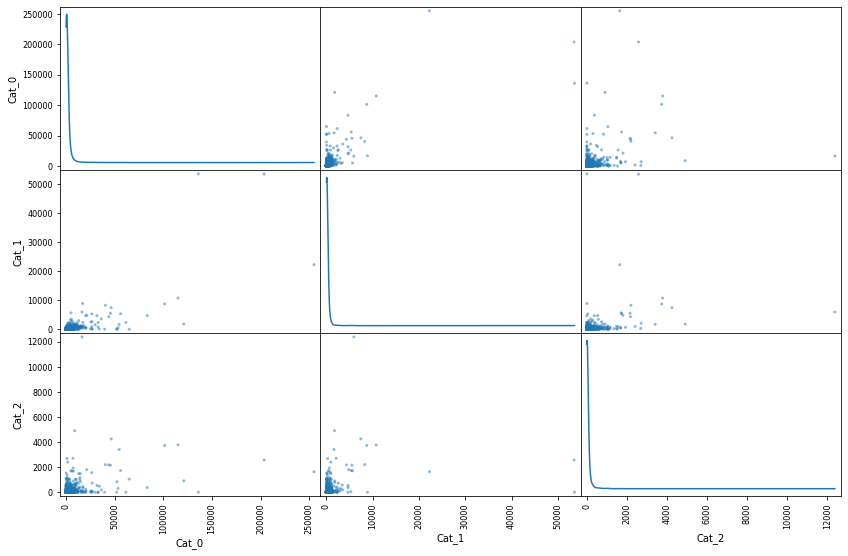

In [12]:
pd.plotting.scatter_matrix(aut0.df_customers.filter(['Cat_0','Cat_1','Cat_2']),figsize=(14,9),diagonal='kde')

$\color{red}{\text{Obs}}$

The data is highly populated near zero

to resolve that we will have to use log

# Kmeans

## Categorical columns only

### Percentage: F, Log: T, Norm: F, PCA: T


in createCatColumns
Creating columns based on product labels
adding column:  Cat_0
adding column:  Cat_1
adding column:  Cat_2
filling NA values
Done

in createBasketsDataFrame

in show_baskets
#### NLP kmeans algorithm 3 product clusters ####

baskets DataFrame:


,CustomerID,InvoiceNo,Cat_0,Cat_1,Cat_2,BasketPrice,InvoiceDate
0,12347,537626,652.99,19.80,39.0,711.79,2010-12-07 14:57:00
1,12347,542237,446.95,28.44,0.0,475.39,2011-01-26 14:30:00
2,12347,549222,606.25,30.00,0.0,636.25,2011-04-07 10:43:00


shape:  (18339, 7)

in createCustomersDataFrame

In show_customers
#### NLP kmeans algorithm 3 product clusters ####

customers DataFrame:


,CustomerID,Cat_0,Cat_1,Cat_2,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,4030.46,223.14,56.4,4310.00,7,224.82,1294.32,615.714286
1,12348,1290.84,171.36,0.0,1462.20,4,187.44,677.76,365.550000
2,12349,1173.90,236.05,47.6,1457.55,1,1457.55,1457.55,1457.550000


shape:  (4324, 9)

in applyKmeans
Setting data
applying Log
Done with Log
applying PCA
[ 63.88676594  88.25615648 100.        ]
Enter the number of dimensions: 3
applying PCA again with modified dimensions
Done with PCA
Done with setting up data

Starting Kmeans
Importing libraries
Done
stated process for getting optimal number of clusters
silhouette_score for 2 clusters is 0.40084688276825153
silhouette_score for 3 clusters is 0.43677295024310075
silhouette_score for 4 clusters is 0.43263407209738236
silhouette_score for 5 clusters is 0.42700584635320943
silhouette_score for 6 clusters is 0.3993302889055773
silhouette_score for 7 clusters is 0.3788953711708432
silhouette_score for 8 clusters is 0.3522006813272671
silhouette_score for 9 clusters is 0.33654442237263704


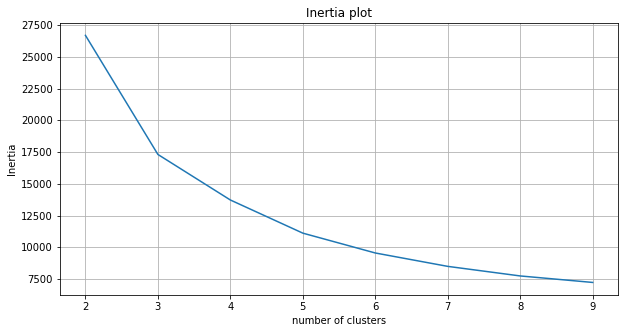

Enter number of clusters: 3
Done
algorithm started
fitting model
Done

Labels: 
 [2 0 2 ... 1 2 0]
**silhouette_score: 0.43677295024310075
Creating a dataframe of result
Done


In [14]:
aut = automation(df10,'NLP_Kmeans_p955c3',"NLP kmeans algorithm 3 product clusters")
aut.createCatColumns()
#aut.show()
aut.createBasketsDataFrame(v=False)
aut.show_baskets()
aut.createCustomersDataFrame(Percentage=False,v=False)
aut.show_customers()
aut.applyKmeans(pca=True,catOnly=True,logg=True,normalise=False)

array([[<AxesSubplot:xlabel='dim_0', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_0'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_1'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_2'>]], dtype=object)

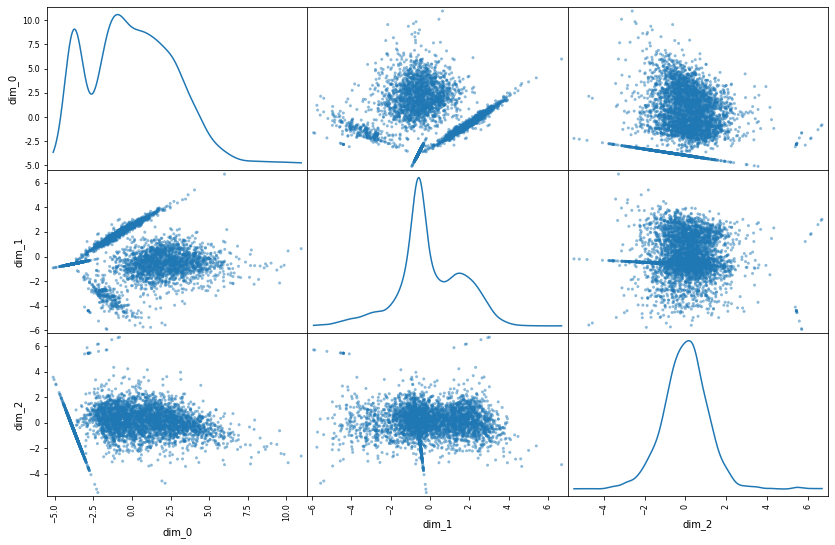

In [15]:
pd.plotting.scatter_matrix(aut.df_clusterData.filter(['dim_0','dim_1','dim_2']),diagonal='kde',figsize=(14,9))

In [16]:
import plotly.express as px
fig = px.scatter_matrix(
    aut.df_clusterData,
    title="Clusters obtained from Kmeans",
    opacity=0.8,
    color=aut.cluster_labels
)
fig.show()

In [17]:
import plotly.express as px

fig = px.scatter_3d(
    aut.df_clusterData, x='dim_0', y='dim_1', z='dim_2',
    title="",
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},\
    opacity=0.75,
    color=aut.cluster_labels
)
fig.show()

### Percentage: T, Log: T, Norm: F, PCA: T


in createCatColumns
Creating columns based on product labels
adding column:  Cat_0
adding column:  Cat_1
adding column:  Cat_2
filling NA values
Done

in createBasketsDataFrame

in show_baskets
#### NLP kmeans algorithm 3 product clusters ####

baskets DataFrame:


,CustomerID,InvoiceNo,Cat_0,Cat_1,Cat_2,BasketPrice,InvoiceDate
0,12347,537626,652.99,19.80,39.0,711.79,2010-12-07 14:57:00
1,12347,542237,446.95,28.44,0.0,475.39,2011-01-26 14:30:00
2,12347,549222,606.25,30.00,0.0,636.25,2011-04-07 10:43:00


shape:  (18339, 7)

in createCustomersDataFrame

In show_customers
#### NLP kmeans algorithm 3 product clusters ####

customers DataFrame:


,CustomerID,Cat_0,Cat_1,Cat_2,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,93.514153,5.177262,1.308585,4310.00,7,224.82,1294.32,615.714286
1,12348,88.280673,11.719327,0.000000,1462.20,4,187.44,677.76,365.550000
2,12349,80.539261,16.194985,3.265754,1457.55,1,1457.55,1457.55,1457.550000


shape:  (4324, 9)

in applyKmeans
Setting data
applying Log
Done with Log
applying PCA
[ 58.86279947  96.39332716 100.        ]
Enter the number of dimensions: 3
applying PCA again with modified dimensions
Done with PCA
Done with setting up data

Starting Kmeans
Importing libraries
Done
stated process for getting optimal number of clusters
silhouette_score for 2 clusters is 0.4444835119353275
silhouette_score for 3 clusters is 0.4630886034123158
silhouette_score for 4 clusters is 0.48796994934149934
silhouette_score for 5 clusters is 0.4760383030730239
silhouette_score for 6 clusters is 0.4736375908549704
silhouette_score for 7 clusters is 0.4812705754337063
silhouette_score for 8 clusters is 0.487294121277028
silhouette_score for 9 clusters is 0.48521870929992494


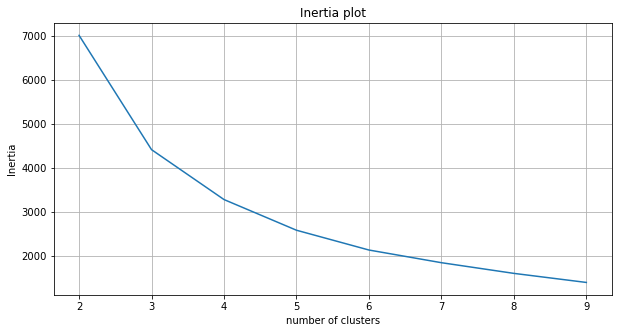

Enter number of clusters: 4
Done
algorithm started
fitting model
Done

Labels: 
 [3 3 0 ... 1 1 1]
**silhouette_score: 0.4875258764394014
Creating a dataframe of result
Done


In [18]:
aut2 = automation(df10,'NLP_Kmeans_p955c3',"NLP kmeans algorithm 3 product clusters")
aut2.createCatColumns()
#aut.show()
aut2.createBasketsDataFrame(v=False)
aut2.show_baskets()
aut2.createCustomersDataFrame(Percentage=True,v=False)
aut2.show_customers()
aut2.applyKmeans(pca=True,catOnly=True,logg=True,normalise=False)

array([[<AxesSubplot:xlabel='dim_0', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_0'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_1'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_2'>]], dtype=object)

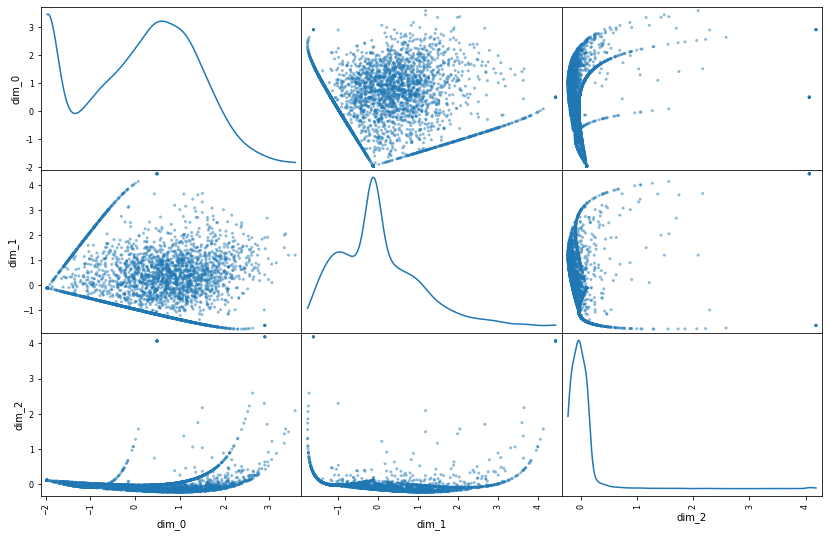

In [19]:
pd.plotting.scatter_matrix(aut2.df_clusterData.filter(['dim_0','dim_1','dim_2']),diagonal='kde',figsize=(14,9))

In [20]:
import plotly.express as px
fig = px.scatter_matrix(
    aut2.df_clusterData,
    title="Clusters obtained from Kmeans",
    opacity=0.8,
    color=aut2.cluster_labels
)
fig.show()

In [21]:
import plotly.express as px

fig = px.scatter_3d(
    aut2.df_clusterData, x='dim_0', y='dim_1', z='dim_2',
    title="",
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},\
    opacity=0.75,
    color=aut2.cluster_labels
)
fig.show()

# Reverse Engineering

In [22]:
pd.DataFrame(aut.model_pca.components_,index=['Dim0','Dim1','Dim2'],columns=['cat1','cat2','cat3'])

,cat1,cat2,cat3
Dim0,1.0,-0.000000e+00,-0.000000e+00
Dim1,-0.0,1.000000e+00,1.330620e-16
Dim2,0.0,-1.224977e-16,1.000000e+00


In [23]:
aut.model_pca.components_

array([[ 1.00000000e+00, -0.00000000e+00, -0.00000000e+00],
       [-0.00000000e+00,  1.00000000e+00,  1.33062012e-16],
       [ 0.00000000e+00, -1.22497747e-16,  1.00000000e+00]])

# Advanced filters

In [25]:
df10.head(2)

,InvoiceNo,StockCode,Description,InvoiceDate,UnitPrice,CustomerID,Country,FinalQuantity,NLP_Kmeans_p6c7,NLP_Kmeans_p6c3,NLP_Kmeans_p955c3
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2010-12-01 08:26:00,2.55,17850,United Kingdom,6,4,1,1
1,536365,71053,WHITE METAL LANTERN,2010-12-01 08:26:00,3.39,17850,United Kingdom,6,0,2,0


In [26]:
df_adv=pd.read_csv('segmented_OnlineRetail.csv')

In [27]:
df_adv.head(2)

,CustomerID,recency,frequency,monetary_value,r_quartile,f_quartile,m_quartile,RFMScore
0,12347,2,182,4310.0,1,1,1,111
1,12348,75,23,1462.2,3,3,2,332


In [30]:
aut.df_customers.head(3)

,CustomerID,Cat_0,Cat_1,Cat_2,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,4030.46,223.14,56.4,4310.00,7,224.82,1294.32,615.714286
1,12348,1290.84,171.36,0.0,1462.20,4,187.44,677.76,365.550000
2,12349,1173.90,236.05,47.6,1457.55,1,1457.55,1457.55,1457.550000


In [31]:
df_mega=pd.concat([df_adv,aut.df_customers],axis=1)

In [32]:
df_mega

,CustomerID,recency,frequency,monetary_value,r_quartile,f_quartile,m_quartile,RFMScore,CustomerID,Cat_0,Cat_1,Cat_2,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,2,182,4310.00,1,1,1,111,12347,4030.46,223.14,56.4,4310.00,7,224.82,1294.32,615.714286
1,12348,75,23,1462.20,3,3,2,332,12348,1290.84,171.36,0.0,1462.20,4,187.44,677.76,365.550000
2,12349,18,72,1457.55,2,2,2,222,12349,1173.90,236.05,47.6,1457.55,1,1457.55,1457.55,1457.550000
3,12350,310,16,294.40,4,4,4,444,12350,294.40,0.00,0.0,294.40,1,294.40,294.40,294.400000
4,12352,36,70,1265.41,2,2,2,222,12352,1121.51,77.00,66.9,1265.41,7,19.80,296.50,180.772857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4319,18280,277,10,180.60,4,4,4,444,18280,180.60,0.00,0.0,180.60,1,180.60,180.60,180.600000
4320,18281,180,7,80.82,4,4,4,444,18281,80.82,0.00,0.0,80.82,1,80.82,80.82,80.820000
4321,18282,7,12,176.60,1,4,4,144,18282,176.60,0.00,0.0,176.60,2,77.84,98.76,88.300000
4322,18283,3,687,2039.58,1,1,1,111,18283,1966.66,59.22,13.7,2039.58,16,1.95,307.05,127.473750


In [33]:
aut.df_clusterData['CustomerID']=df_adv['CustomerID']

In [34]:
aut.df_clusterData

,dim_0,dim_1,dim_2,CustomerID
0,3.440929,-0.140335,-0.951402,12347
1,0.407116,2.749305,-0.489884,12348
2,3.003702,-0.071553,0.212681,12349
3,-3.781542,-0.589367,-0.550816,12350
4,2.388770,-1.030558,-0.014590,12352
...,...,...,...,...
4319,-3.929639,-0.627012,-0.088911,18280
4320,-4.172329,-0.688701,0.668029,18281
4321,-3.936418,-0.628735,-0.067766,18282
4322,1.428476,0.038059,-0.826582,18283


user will say plot customers who have score 111

In [35]:
df_mega.groupby('RFMScore').get_group(111)['CustomerID'].iloc[:,0].index

Int64Index([   0,   14,   33,   55,   60,   70,   74,   85,   98,  101,
            ...
            4259, 4266, 4274, 4278, 4280, 4284, 4294, 4296, 4314, 4322],
           dtype='int64', length=447)

In [36]:
filter111=df_mega.groupby('RFMScore').get_group(111)['CustomerID'].iloc[:,0].index

In [37]:
filter111

Int64Index([   0,   14,   33,   55,   60,   70,   74,   85,   98,  101,
            ...
            4259, 4266, 4274, 4278, 4280, 4284, 4294, 4296, 4314, 4322],
           dtype='int64', length=447)

In [128]:
aut.df_clusterData.iloc[filter111]

,dim_0,dim_1,dim_2,CustomerID
0,3.440929,-0.140335,-0.951402,12347
14,2.399866,0.407157,-1.360549,12362
33,0.806073,2.966831,-1.064001,12388
55,2.841634,-1.278974,-0.921826,12417
60,-0.494565,1.934494,-1.057710,12423
...,...,...,...,...
4284,0.418015,-4.411367,-2.863285,18229
4294,0.777372,3.006042,-0.706059,18241
4296,3.689668,-0.301323,-0.241890,18245
4314,2.739247,-0.578260,-0.868455,18272


In [40]:
# for colors
labels_mod=pd.DataFrame({'id':range(df_adv.shape[0]),'label':aut.cluster_labels}).iloc[filter111]['label'].values

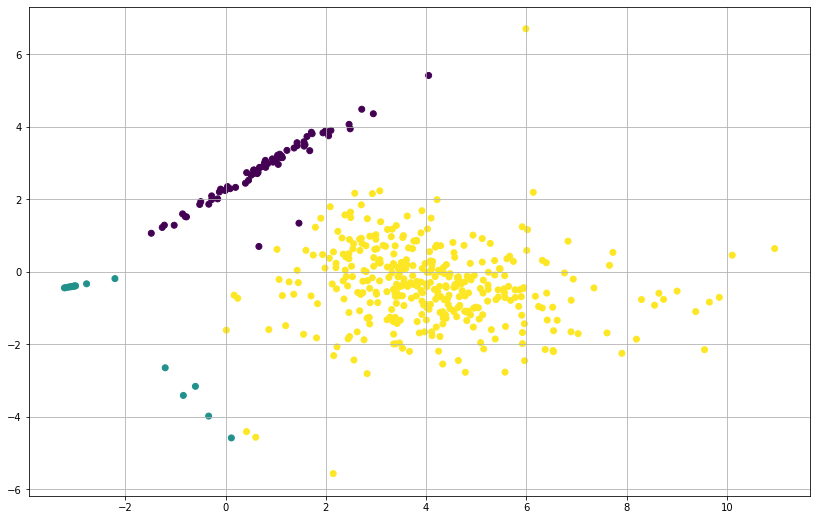

In [41]:
plt.figure(figsize=(14,9))
plt.scatter(aut.df_clusterData.iloc[filter111]['dim_0'],aut.df_clusterData.iloc[filter111]['dim_1'], c= labels_mod,alpha=1)
plt.grid()
plt.show()

In [42]:
import plotly.express as px

fig = px.scatter_3d(
    aut.df_clusterData.iloc[filter111], x='dim_0', y='dim_1', z='dim_2',
    title="",
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},\
    opacity=0.75,
    color=labels_mod
)
fig.show()

In [43]:
# original plot
import plotly.express as px

fig = px.scatter_3d(
    aut.df_clusterData, x='dim_0', y='dim_1', z='dim_2',
    title="",
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},\
    opacity=0.75,
    color=aut.cluster_labels
)
fig.show()

# Habits

In [47]:
from sklearn import preprocessing
minmax_scaler = preprocessing.MinMaxScaler()

In [51]:
aut.model_Kmeans.cluster_centers_[0],\
aut.model_Kmeans.cluster_centers_[1],\
aut.model_Kmeans.cluster_centers_[2]

(array([-0.60153738,  1.78832082,  0.24124749]),
 array([-3.11191378, -1.18450926, -0.42250923]),
 array([ 2.54656369, -0.6134088 ,  0.09239475]))

In [48]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=minmax_scaler.fit_transform(aut.model_Kmeans.cluster_centers_[0].reshape(-1,1)).reshape(3,)*100,
    theta=['Home accessories','Gift materials','Kitchen materials']))
fig = px.line_polar(df, r='r', theta='theta', line_close=True,title="Habits of customers in cluster 0")
fig.show()

In [52]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=minmax_scaler.fit_transform(aut.model_Kmeans.cluster_centers_[1].reshape(-1,1)).reshape(3,)*100,
    theta=['Home accessories','Gift materials','Kitchen materials']))
fig = px.line_polar(df, r='r', theta='theta', line_close=True,title="Habits of customers in cluster 1")
fig.show()

In [53]:
import plotly.express as px
import pandas as pd
df = pd.DataFrame(dict(
    r=minmax_scaler.fit_transform(aut.model_Kmeans.cluster_centers_[2].reshape(-1,1)).reshape(3,)*100,
    theta=['Home accessories','Gift materials','Kitchen materials']))
fig = px.line_polar(df, r='r', theta='theta', line_close=True,title="Habits of customers in cluster 2")
fig.show()

# Clustering with respect to Unit price

In [54]:
df11.head(3)

,InvoiceNo,StockCode,Description,InvoiceDate,UnitPrice,CustomerID,Country,FinalQuantity,Labels_wrt_unitPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2010-12-01 08:26:00,2.55,17850,United Kingdom,6,2
1,536365,71053,WHITE METAL LANTERN,2010-12-01 08:26:00,3.39,17850,United Kingdom,6,3
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,2010-12-01 08:26:00,2.75,17850,United Kingdom,8,3



in createCatColumns
Creating columns based on product labels
adding column:  Cat_0
adding column:  Cat_1
adding column:  Cat_2
adding column:  Cat_3
adding column:  Cat_4
adding column:  Cat_5
filling NA values
Done

In show
#### CLustering wrt UnitPrice of products ####

DataFrame:


,InvoiceNo,StockCode,Description,InvoiceDate,UnitPrice,CustomerID,Country,FinalQuantity,Labels_wrt_unitPrice,Cat_0,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2010-12-01 08:26:00,2.55,17850,United Kingdom,6,2,0.0,0.0,15.3,0.00,0.0,0.0
1,536365,71053,WHITE METAL LANTERN,2010-12-01 08:26:00,3.39,17850,United Kingdom,6,3,0.0,0.0,0.0,20.34,0.0,0.0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,2010-12-01 08:26:00,2.75,17850,United Kingdom,8,3,0.0,0.0,0.0,22.00,0.0,0.0


shape:  (383873, 15)

Product label column name:  Labels_wrt_unitPrice

in createBasketsDataFrame

in show_baskets
#### CLustering wrt UnitPrice of products ####

baskets DataFrame:


,CustomerID,InvoiceNo,Cat_0,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,BasketPrice,InvoiceDate
0,12347,537626,23.40,187.2,83.4,293.35,124.44,0.00,711.79,2010-12-07 14:57:00
1,12347,542237,84.34,130.5,53.1,169.20,0.00,38.25,475.39,2011-01-26 14:30:00
2,12347,549222,81.00,330.9,71.1,115.00,0.00,38.25,636.25,2011-04-07 10:43:00


shape:  (18339, 10)

in createCustomersDataFrame

In show_customers
#### CLustering wrt UnitPrice of products ####

customers DataFrame:


,CustomerID,Cat_0,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,484.32,1136.80,896.70,1273.19,327.74,191.25,4310.00,7,224.82,1294.32,615.714286
1,12348,708.20,754.00,0.00,0.00,0.00,0.00,1462.20,4,187.44,677.76,365.550000
2,12349,79.32,465.86,215.22,188.30,358.35,150.50,1457.55,1,1457.55,1457.55,1457.550000


shape:  (4324, 12)

in applyKmeans
Setting data
applying Log
Done with Log
Done with setting up data

Starting Kmeans
Importing libraries
Done
stated process for getting optimal number of clusters
silhouette_score for 2 clusters is 0.31228762605684707
silhouette_score for 3 clusters is 0.24236478534702807
silhouette_score for 4 clusters is 0.2405044812408025
silhouette_score for 5 clusters is 0.24702899024615513
silhouette_score for 6 clusters is 0.24989412484933465
silhouette_score for 7 clusters is 0.22784764062186166
silhouette_score for 8 clusters is 0.21954146432026003
silhouette_score for 9 clusters is 0.2275731985993428


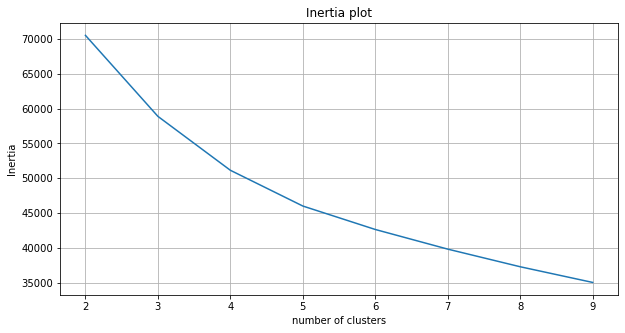

Enter number of clusters: 2
Done
algorithm started
fitting model
Done

Labels: 
 [0 1 0 ... 1 0 0]
**silhouette_score: 0.3122031015002415
Creating a dataframe of result
Done
Vizualise: 


array([[<AxesSubplot:xlabel='dim_0', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_3', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_4', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_5', ylabel='dim_0'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_3', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_4', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_5', ylabel='dim_1'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_3', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_4', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_5', ylabel='dim_2'>],
       [<AxesSubplot:xlab

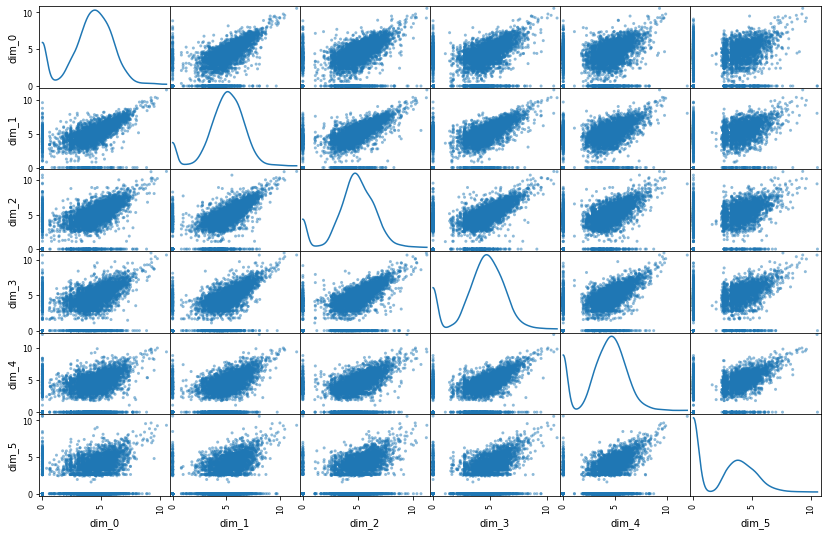

In [55]:
aut_up = automation(df11,'Labels_wrt_unitPrice',"CLustering wrt UnitPrice of products")
aut_up.createCatColumns()
aut_up.show()

aut_up.createBasketsDataFrame(v=False)
aut_up.show_baskets()

aut_up.createCustomersDataFrame(Percentage=False,v=False)
aut_up.show_customers()

aut_up.applyKmeans(pca=False,catOnly=True,logg=True,normalise=False)

print("Vizualise: ")
pd.plotting.scatter_matrix(aut_up.df_clusterData,figsize=(14,9),diagonal='kde')

In [56]:
import plotly.express as px

fig = px.scatter_matrix(
    aut_up.df_clusterData,
    title="",
    opacity=1,
    color=aut_up.cluster_labels
)
fig.show()

colors are not explaining clusters, they are overlapping


in createCatColumns
Creating columns based on product labels
adding column:  Cat_0
adding column:  Cat_1
adding column:  Cat_2
adding column:  Cat_3
adding column:  Cat_4
adding column:  Cat_5
filling NA values
Done

In show
#### CLustering wrt UnitPrice of products ####

DataFrame:


,InvoiceNo,StockCode,Description,InvoiceDate,UnitPrice,CustomerID,Country,FinalQuantity,Labels_wrt_unitPrice,Cat_0,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,2010-12-01 08:26:00,2.55,17850,United Kingdom,6,2,0.0,0.0,15.3,0.00,0.0,0.0
1,536365,71053,WHITE METAL LANTERN,2010-12-01 08:26:00,3.39,17850,United Kingdom,6,3,0.0,0.0,0.0,20.34,0.0,0.0
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,2010-12-01 08:26:00,2.75,17850,United Kingdom,8,3,0.0,0.0,0.0,22.00,0.0,0.0


shape:  (383873, 15)

Product label column name:  Labels_wrt_unitPrice

in createBasketsDataFrame

in show_baskets
#### CLustering wrt UnitPrice of products ####

baskets DataFrame:


,CustomerID,InvoiceNo,Cat_0,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,BasketPrice,InvoiceDate
0,12347,537626,23.40,187.2,83.4,293.35,124.44,0.00,711.79,2010-12-07 14:57:00
1,12347,542237,84.34,130.5,53.1,169.20,0.00,38.25,475.39,2011-01-26 14:30:00
2,12347,549222,81.00,330.9,71.1,115.00,0.00,38.25,636.25,2011-04-07 10:43:00


shape:  (18339, 10)

in createCustomersDataFrame

In show_customers
#### CLustering wrt UnitPrice of products ####

customers DataFrame:


,CustomerID,Cat_0,Cat_1,Cat_2,Cat_3,Cat_4,Cat_5,BasketPrice,Frequency,MinPurchase,MaxPurchase,MeanPurchase
0,12347,484.32,1136.80,896.70,1273.19,327.74,191.25,4310.00,7,224.82,1294.32,615.714286
1,12348,708.20,754.00,0.00,0.00,0.00,0.00,1462.20,4,187.44,677.76,365.550000
2,12349,79.32,465.86,215.22,188.30,358.35,150.50,1457.55,1,1457.55,1457.55,1457.550000


shape:  (4324, 12)

in applyKmeans
Setting data
applying Log
Done with Log
applying PCA
[ 56.0550911   72.16971204  81.80883397  88.87368307  95.39436806
 100.        ]
Enter the number of dimensions: 5
applying PCA again with modified dimensions
Done with PCA
Done with setting up data

Starting Kmeans
Importing libraries
Done
stated process for getting optimal number of clusters
silhouette_score for 2 clusters is 0.3254198221403462
silhouette_score for 3 clusters is 0.2554132050554432
silhouette_score for 4 clusters is 0.2584857008207484
silhouette_score for 5 clusters is 0.2642303383496661
silhouette_score for 6 clusters is 0.2695803950685257
silhouette_score for 7 clusters is 0.24821751901109743
silhouette_score for 8 clusters is 0.25361527120888955
silhouette_score for 9 clusters is 0.2473620760126212


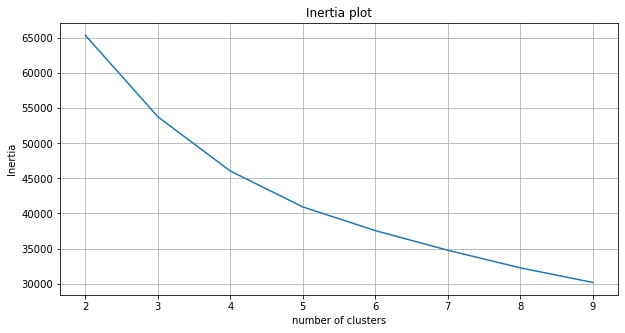

Enter number of clusters: 2
Done
algorithm started
fitting model
Done

Labels: 
 [0 1 0 ... 1 0 0]
**silhouette_score: 0.3250990187067039
Creating a dataframe of result
Done
Vizualise: 


array([[<AxesSubplot:xlabel='dim_0', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_3', ylabel='dim_0'>,
        <AxesSubplot:xlabel='dim_4', ylabel='dim_0'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_3', ylabel='dim_1'>,
        <AxesSubplot:xlabel='dim_4', ylabel='dim_1'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_3', ylabel='dim_2'>,
        <AxesSubplot:xlabel='dim_4', ylabel='dim_2'>],
       [<AxesSubplot:xlabel='dim_0', ylabel='dim_3'>,
        <AxesSubplot:xlabel='dim_1', ylabel='dim_3'>,
        <AxesSubplot:xlabel='dim_2', ylabel='dim_3'>,
        <AxesSubplot:xlab

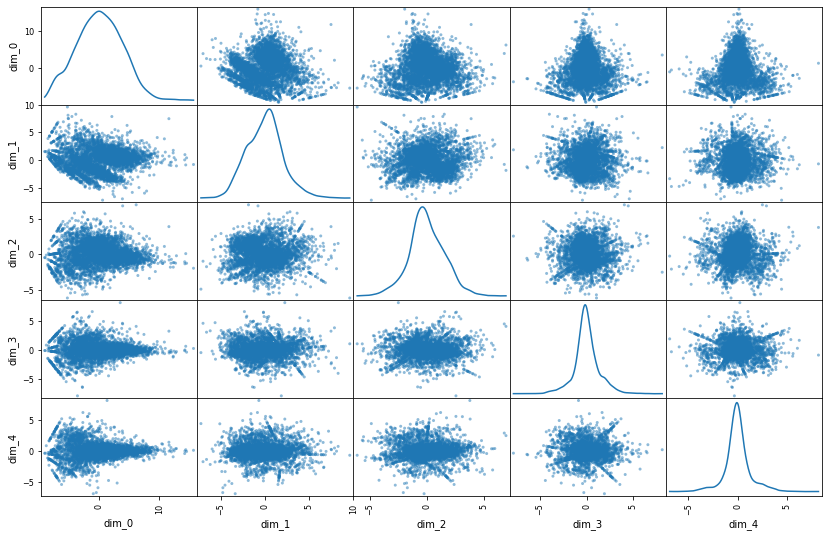

In [57]:
aut_up = automation(df11,'Labels_wrt_unitPrice',"CLustering wrt UnitPrice of products")
aut_up.createCatColumns()
aut_up.show()

aut_up.createBasketsDataFrame(v=False)
aut_up.show_baskets()

aut_up.createCustomersDataFrame(Percentage=False,v=False)
aut_up.show_customers()

aut_up.applyKmeans(pca=True,catOnly=True,logg=True,normalise=False)

print("Vizualise: ")
pd.plotting.scatter_matrix(aut_up.df_clusterData,figsize=(14,9),diagonal='kde')

In [58]:
import plotly.express as px

fig = px.scatter_matrix(
    aut_up.df_clusterData,
    title="",
    opacity=1,
    color=aut_up.cluster_labels
)
fig.show()